In [1]:
### Import library ##########################################################################################################
import os
import opensilexClientToolsPython as osC
import pandas as pd
import sys
import datetime
from lxml import etree as ET
import json
import yaml
from tqdm import tqdm
print("Library Imported")

Library Imported


# Set Working Directories
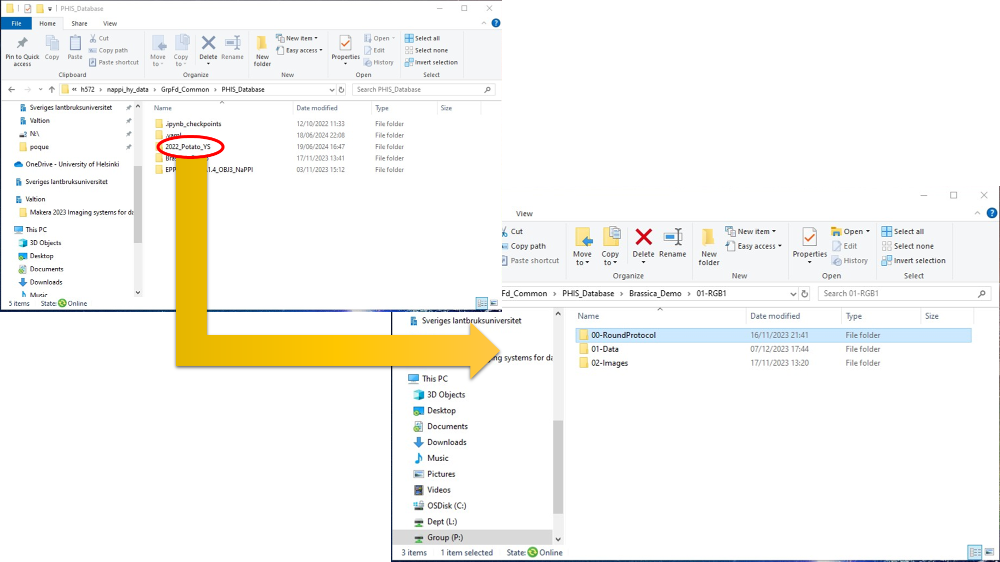

In [325]:
ExpName='2022_Potato_YS'

### Set database wd #########################################################################################################
wd = os.path.normpath(r"P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database")
os.chdir(wd)

wd_exp=os.path.join(wd, ExpName)

print(f'Exp Working Directory: {wd_exp}')

Exp Working Directory: P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database\2022_Potato_YS


# Conection to PHIS Instance

In [326]:
## Get Login Info ###########################################################################################################
with open (os.path.join(wd, '.yaml', '00-login.yaml'), 'r') as stream: #Demo-login.yaml
    login=yaml.safe_load(stream)

### Connect to PHIS Database ################################################################################################
Py_Client = osC.ApiClient()
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])
#print(Py_Client.default_headers['Authorization'])
if Py_Client.default_headers:
    print("Connected")

# Instance alternative link (UH):
    # "https://phis.emphasis.fedcloud.eu/uh/rest"
    # "http://78.128.251.31:8081/uh/rest"
    # 'https://phis.emphasis.fedcloud.eu/egi-demo'

Connected


# Get metadata and data
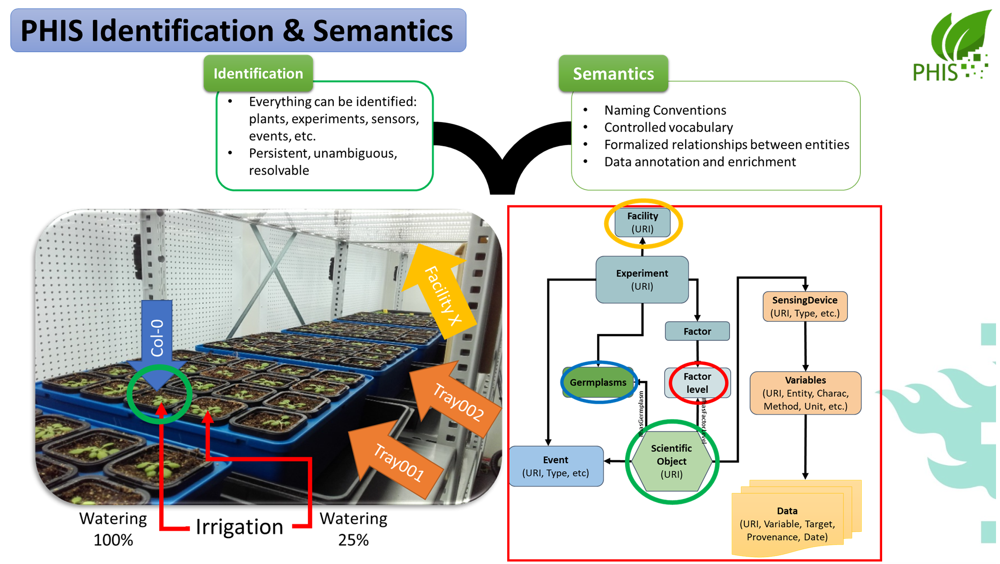

## Get Experiment Info

In [327]:
Exp_Api = osC.ExperimentsApi(Py_Client)
Exp_Src = Exp_Api.search_experiments(name=ExpName)["result"]

print(Exp_Src)
print('\n')
print('#'*90)
print('\n')

uri_exp = Exp_Src[0].uri
start_date = Exp_Src[0].start_date
end_date = Exp_Src[0].end_date
uri_facility = Exp_Src[0].facilities
Facility='Modular'

print(f'Exp URI: {uri_exp}\nExp Start Date: {start_date}\nExp End Date: {end_date}\nExp Facility URI: {uri_facility}\n')

[{'description': "The potato variety 'Timo' was subjected to 12 different "
                'drought treatments by reducing soil water holding capacities '
                'to 40% and 25% for three durations (7 days, 20 days, and 30 '
                'days) at various growth stages (Emergence, Stolon Initiation, '
                'Tuber Initiation, and Tuber Filling).',
 'end_date': '2022-08-29',
 'facilities': ['uh:id/organization/facility.plantscreen_modular_system',
                'uh:id/organization/facility.modular_nappi'],
 'is_public': False,
 'name': '2022_Potato_YS',
 'objective': "Study the potato's response to drought stress applied at "
              'different growth stages.',
 'species': ['uh:id/germplasm/species.potato'],
 'start_date': '2022-05-30',
 'uri': 'uh:id/experiment/2022_pot_ys'}]


##########################################################################################


Exp URI: uh:id/experiment/2022_pot_ys
Exp Start Date: 2022-05-30
Exp End Date: 2022-08-

## Get RGB1 Dataframe

In [328]:
# Define the target datetime format with timezone offset
desired_format = "%Y-%m-%dT%H:%M:%S%z"

df_data = pd.read_excel(os.path.join(wd_exp,'2022_Pot_YieldSys_RGB1_B02_Morpho.xlsx'))
df_data['Measuring Date'] = df_data['Measuring Date'].dt.date
df_data['Measuring Time'] = df_data['Measuring Time'].dt.tz_localize('UTC').dt.tz_convert('Europe/Helsinki').dt.strftime(desired_format)
df_data.head()

,Measuring Date,Measuring Time,Experiment ID,PID,Round Order,Tray ID,Plant Name,Species,Cultivar,Water Level,Stage Application,Application Period,Replicate,Angle,AREA_CM,PERIMETER_CM,COMPACTNESS,WIDTH_CM,HEIGHT_CM
0,2022-06-07,2022-06-07T19:16:59+0300,98,RGB1,1,2022_Pot_YS_081,WW_All_Full,Potato,Timo,Well Water,All,Full,10,0,4.450392,2.270290,0.245975,7.499408,3.110665
1,2022-06-07,2022-06-07T19:17:33+0300,98,RGB1,1,2022_Pot_YS_081,WW_All_Full,Potato,Timo,Well Water,All,Full,10,90,9.683462,4.743009,0.449854,6.404900,4.397836
2,2022-06-07,2022-06-07T19:18:09+0300,98,RGB1,1,2022_Pot_YS_081,WW_All_Full,Potato,Timo,Well Water,All,Full,10,180,7.465875,4.801613,0.262197,9.445200,4.076043
3,2022-06-07,2022-06-07T19:19:36+0300,98,RGB1,1,2022_Pot_YS_082,WD_Mat_Short,Potato,Timo,Well Water,All,Full,12,0,9.289949,4.097370,0.588081,3.364599,6.328594
4,2022-06-07,2022-06-07T19:20:10+0300,98,RGB1,1,2022_Pot_YS_082,WD_Mat_Short,Potato,Timo,Well Water,All,Full,12,90,9.859564,4.768449,0.238722,8.837140,6.435858


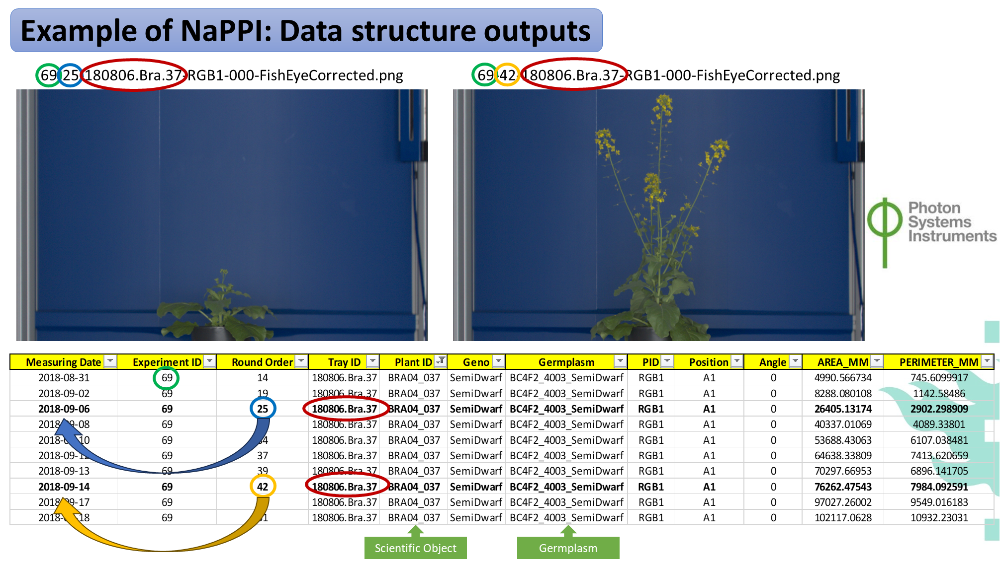

## Get Metadata

In [329]:
PID=df_data['PID'].unique()[0]
print(f'PID found: {PID}')

Facility='Modular'

df_ScObj = df_data.loc[:, "Tray ID":"Application Period"].drop_duplicates().dropna()
df_ScObj = df_ScObj.drop(columns=['Plant Name'])
df_ScObj.head()

PID found: RGB1


,Tray ID,Species,Cultivar,Water Level,Stage Application,Application Period
0,2022_Pot_YS_081,Potato,Timo,Well Water,All,Full
3,2022_Pot_YS_082,Potato,Timo,Well Water,All,Full
6,2022_Pot_YS_083,Potato,Timo,Water Deficiency,Tuber Initiation,Long
9,2022_Pot_YS_084,Potato,Timo,Water Deficiency,Stolon Initiation,Long
12,2022_Pot_YS_085,Potato,Timo,Water Deficiency,Stolon Initiation,Short


## Get Scientific Objects Name&URI

In [330]:
# Get Scientific Objects Name&URI #################################################################
ScObj_Api = osC.ScientificObjectsApi(Py_Client)
ScObj_uri = {}
ScObj_missing = []
for index, row in tqdm(df_ScObj.iterrows(), desc="ScObj processing:"):
    ScObj_Src = ScObj_Api.search_scientific_objects(name=row["Tray ID"])["result"]
    if ScObj_Src:
        ScObj_uri.update({row["Tray ID"]: ScObj_Src[0].uri})
    else:
        ScObj_missing.append(row["Tray ID"])
        
print('Five First ScObj:')
# Display the first 5 elements
for key, value in list(ScObj_uri.items())[:5]:
    print(f'{key}: {value}')
print('\n')
print(f'{len(ScObj_missing)} ScObj missing')

ScObj processing:: 80it [00:04, 16.42it/s]

Five First ScObj:
2022_Pot_YS_081: uh:id/scientific-object/so-2022_pot_ys_081
2022_Pot_YS_082: uh:id/scientific-object/so-2022_pot_ys_082
2022_Pot_YS_083: uh:id/scientific-object/so-2022_pot_ys_083
2022_Pot_YS_084: uh:id/scientific-object/so-2022_pot_ys_084
2022_Pot_YS_085: uh:id/scientific-object/so-2022_pot_ys_085


0 ScObj missing


## Get Round Protocol Info
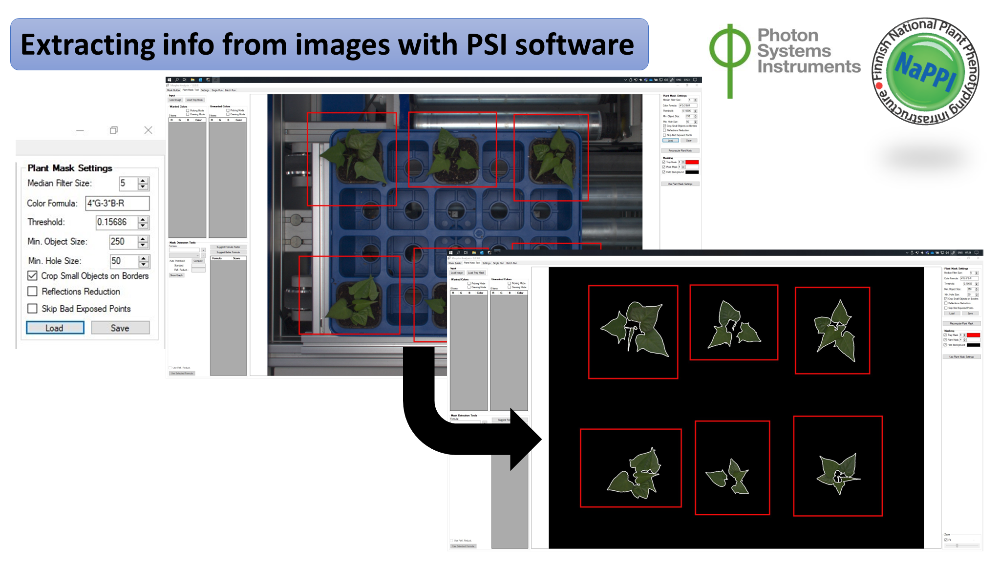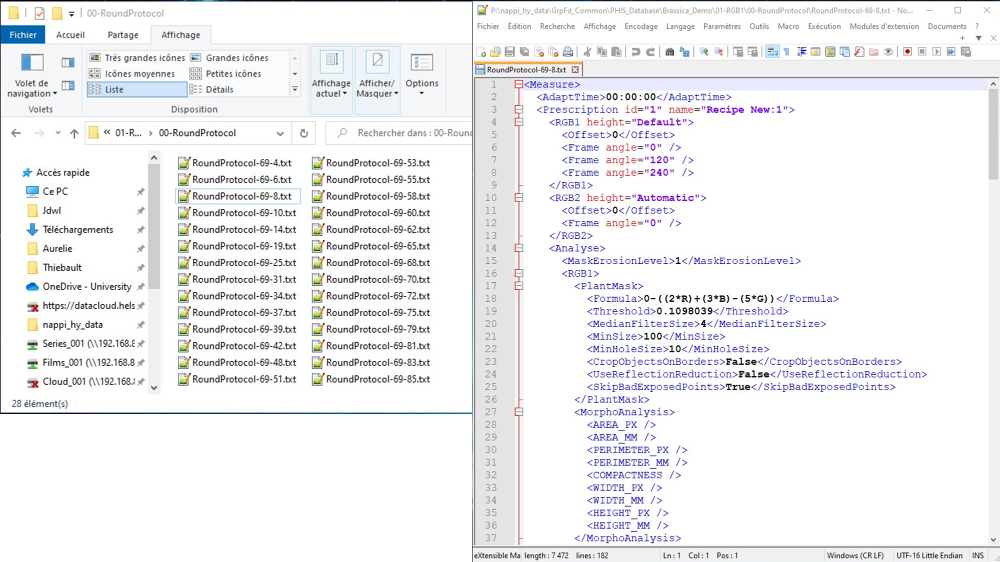

In [331]:
### Get RoundProtocol Infos #################################################################################################
Round_folder = os.path.join(wd_exp, f'RoundProtocol_{PID}')
Round_files = []
for (root, dirs, files) in os.walk(Round_folder):
    for name in files:
        Round_files.append(os.path.join(root, name))
del root, dirs, files, name

## Link RoundProtocol wd with Experiment and Round Numbers ########################################
Exp_Rd_Dict = {}
for wd_round in Round_files:
    Exp_Rd_temp = str.replace(wd_round, str(Round_folder+"\RoundProtocol-"), "")
    Exp_Rd = str.replace(Exp_Rd_temp, ".txt", "")
    Exp_Rd_ls = Exp_Rd.split("-")
    Exp_Rd_Dict.update({wd_round: {"Experiment": Exp_Rd_ls[0], "Round": Exp_Rd_ls[1]}})
del wd_round, Exp_Rd_temp, Exp_Rd, Exp_Rd_ls, Round_files, Round_folder

## Create Dictionary for all parameters ###########################################################
PlantMask = {}
CamPos = {}
ColorSeg = {}

## Transform RoundProtocol to acceptable xml ######################################################
for key, value in Exp_Rd_Dict.items():
    with open(key) as file:
        xml_like = file.read()
    file.close()
    xml_str = str.replace(xml_like, "\x00", "", -1)
    root = ET.fromstring(xml_str)
    del file, xml_like, xml_str

## Get PlantMask Info for all rounds ##############################################################
    PlantMask_rd = {}
    for child in root.iter(PID):
        for subchild in child.iter("PlantMask"):
            for i in subchild.iter():
                PlantMask_rd.update({i.tag: i.text})
    if 'PlantMask' in PlantMask_rd:
        del PlantMask_rd['PlantMask']
    PlantMask.update({value["Round"]: PlantMask_rd})
    del child, subchild, i, PlantMask_rd
## Get Camera Position Info for all rounds ########################################################
    CamPos_rd = {}
    for child in root.iter(PID):
        CamPos_rd.update(child.attrib)
    for child in root.iter(PID):
        for subchild in child.iter("Offset"):
            CamPos_rd.update({subchild.tag: subchild.text})
    CamPos.update({value["Round"]: CamPos_rd})
    del child, subchild, CamPos_rd

print("PlantMask, and Camera Position Info Listed")
del key, value, Exp_Rd_Dict, root

PlantMask, and Camera Position Info Listed


In [333]:
PlantMask['10']

{'Formula': '1-((1*R)-(5*G)+(4*B))',
 'Threshold': '0.090000',
 'MedianFilterSize': '3',
 'MinSize': '250',
 'MinHoleSize': '50',
 'CropObjectsOnBorders': 'false',
 'UseReflectionReduction': 'false',
 'SkipBadExposedPoints': 'true'}

In [334]:
CamPos['4']

{'height': 'Automatic', 'Offset': '0'}

## Get links between Round and Date <font color="red">Simple association, not used here</font>

In [ ]:
#%% Get Round Info in Dict ##################################################################################################
Date_Round={}
for index, row in df_data.iterrows():
    Date_Round.update({row["Round Order"]: row['Measuring Date']})
del index, row

first_key = next(iter(Date_Round))
first_value = Date_Round[first_key]
print("Round Order:", first_key)
print("Date:", first_value)

## Get links between Image Names and Timestamp

In [335]:
df_data['Img Name'] = df_data.apply(lambda row: f"{row['Experiment ID']}-{row['Round Order']}-{row['Tray ID']}-{row['PID']}-{row['Angle']:03}", axis=1)
display(df_data.head())

#%% Get Round Info in Dict ##################################################################################################
TimeStamp={}
for index, row in df_data.iterrows():
    TimeStamp.update({row["Img Name"]: row['Measuring Time']})
del index, row

first_key = next(iter(TimeStamp))
first_value = TimeStamp[first_key]
print("Img Name:", first_key)
print("Measuring Time:", first_value)

,Measuring Date,Measuring Time,Experiment ID,PID,Round Order,Tray ID,Plant Name,Species,Cultivar,Water Level,Stage Application,Application Period,Replicate,Angle,AREA_CM,PERIMETER_CM,COMPACTNESS,WIDTH_CM,HEIGHT_CM,Img Name
0,2022-06-07,2022-06-07T19:16:59+0300,98,RGB1,1,2022_Pot_YS_081,WW_All_Full,Potato,Timo,Well Water,All,Full,10,0,4.450392,2.270290,0.245975,7.499408,3.110665,98-1-2022_Pot_YS_081-RGB1-000
1,2022-06-07,2022-06-07T19:17:33+0300,98,RGB1,1,2022_Pot_YS_081,WW_All_Full,Potato,Timo,Well Water,All,Full,10,90,9.683462,4.743009,0.449854,6.404900,4.397836,98-1-2022_Pot_YS_081-RGB1-090
2,2022-06-07,2022-06-07T19:18:09+0300,98,RGB1,1,2022_Pot_YS_081,WW_All_Full,Potato,Timo,Well Water,All,Full,10,180,7.465875,4.801613,0.262197,9.445200,4.076043,98-1-2022_Pot_YS_081-RGB1-180
3,2022-06-07,2022-06-07T19:19:36+0300,98,RGB1,1,2022_Pot_YS_082,WD_Mat_Short,Potato,Timo,Well Water,All,Full,12,0,9.289949,4.097370,0.588081,3.364599,6.328594,98-1-2022_Pot_YS_082-RGB1-000
4,2022-06-07,2022-06-07T19:20:10+0300,98,RGB1,1,2022_Pot_YS_082,WD_Mat_Short,Potato,Timo,Well Water,All,Full,12,90,9.859564,4.768449,0.238722,8.837140,6.435858,98-1-2022_Pot_YS_082-RGB1-090


Img Name: 98-1-2022_Pot_YS_081-RGB1-000
Measuring Time: 2022-06-07T19:16:59+0300


## Get Provenance Name&URI
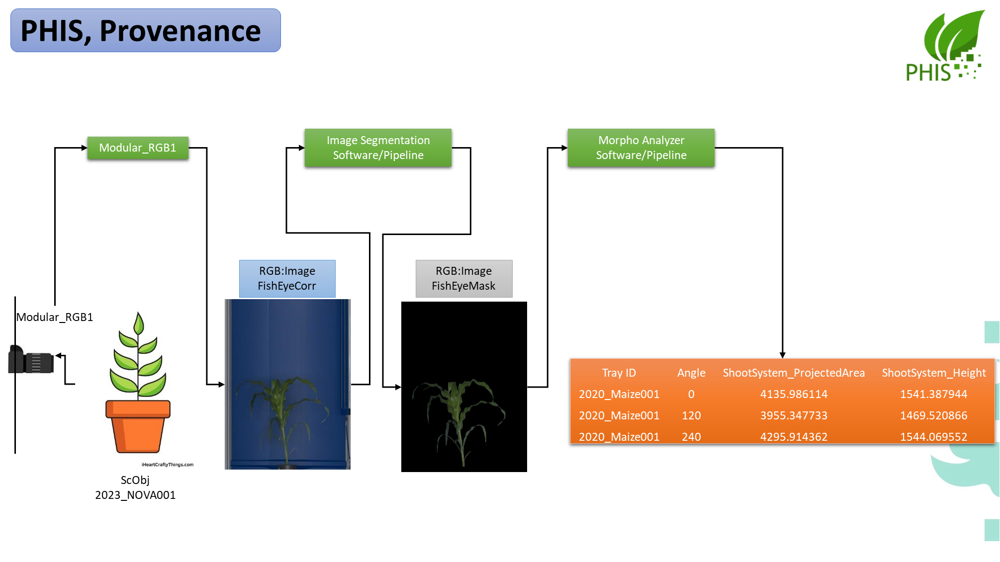

In [337]:
# Get Fish-Eye Corrected Provenance ###############################################################
Dat_Api = osC.DataApi(Py_Client)

prov_dict = {}

prov = str("{}_{}_FishEyeCorrectedImages".format(Facility, PID))
Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
if Prov_Src:
    prov_dict.update({prov: Prov_Src[0].uri})
    print(f"{prov} URI: {Prov_Src[0].uri}")
else:
    print(f"Provenance {prov} is missing")

prov = str("{}_{}_FishEyeMaskedImages".format(Facility, PID))
Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
if Prov_Src:
    prov_dict.update({prov: Prov_Src[0].uri})
    print(f"{prov} URI: {Prov_Src[0].uri}")
else:
    print(f"Provenance {prov} is missing")

prov = str("{}_{}_MorphoParameters".format(Facility, PID))
Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
if Prov_Src:
    prov_dict.update({prov: Prov_Src[0].uri})
    print(f"{prov} URI: {Prov_Src[0].uri}")
else:
    print(f"Provenance {prov} is missing")

Modular_RGB1_FishEyeCorrectedImages URI: uh:id/provenance/modular_rgb1_fisheyecorrectedimages
Modular_RGB1_FishEyeMaskedImages URI: uh:id/provenance/modular_rgb1_fisheyemaskedimages
Modular_RGB1_MorphoParameters URI: uh:id/provenance/modular_rgb1_morphoparameters


# Import Images

## List all images

In [338]:
wd_img = os.path.join(wd_exp, 'Images')

ls_files = []
for (root, dirs, files) in os.walk(wd_img):
    for filename in files:
        if filename.endswith(".png"):
            ls_files.append(os.path.join(root, filename))


ls_fec = [x for x in ls_files if "-FishEyeCorrected" in x]
ls_fem = [x for x in ls_files if "-FishEyeMasked" in x ]

print(f'Numbers of FEC Img: {len(ls_fec)}\nNumbers of FEM: {len(ls_fem)}')

Numbers of FEC Img: 18
Numbers of FEM: 18


## Get FEC Metadata
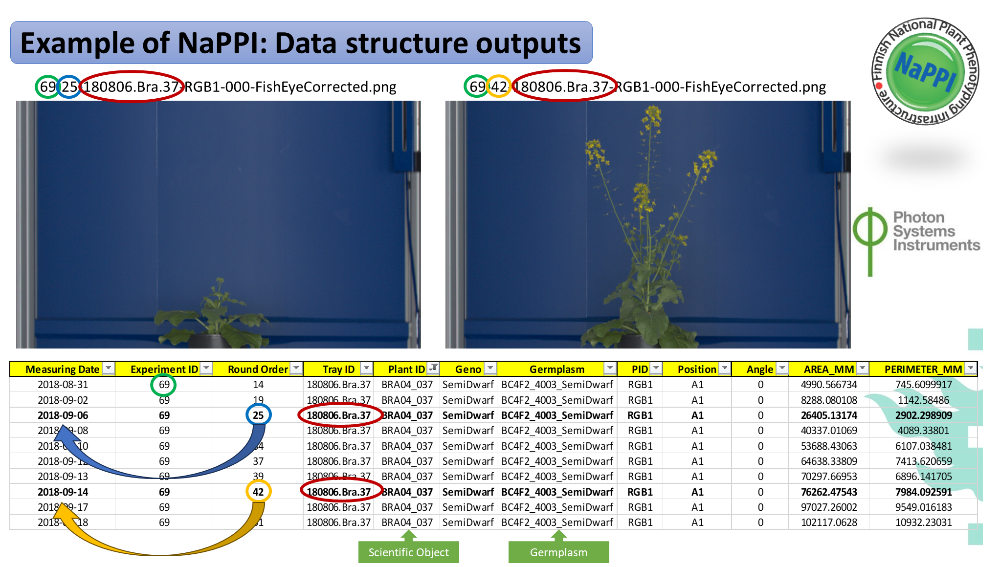

In [349]:
prov='Modular_RGB1_FishEyeCorrectedImages'

# Initialize an empty list to store all the dictionaries
Corr_Name_All = []

# Loop through each file in ls_fec
for corr in ls_fec:
    # Extract the base filename and remove the ".png" extension
    Corr_temp1 = os.path.basename(corr).replace(".png", "")
    Corr_temp2 = os.path.basename(corr).replace("-FishEyeCorrected.png", "")
    # Split the filename into its components
    Corr_ls = Corr_temp1.split("-")
    
    # Create the dictionary with common keys
    Corr_Dict = {
        "Path": corr,
        "Experiment ID": Corr_ls[0],
        "Round Order": Corr_ls[1],
        "Date": str(TimeStamp[Corr_temp2]),
        "Tray ID": Corr_ls[2],
        "PID": Corr_ls[3],
        'Prov': prov_dict[prov],
        "ImgType": Corr_ls[-1]
    }
    
    # Add the "Angle" key only if PID is 'RGB1'
    if PID == 'RGB1':
        Corr_Dict["Angle"] = Corr_ls[4]
    # Append the dictionary to the list
    Corr_Name_All.append(Corr_Dict)

# Display the first dictionary in the list
display(Corr_Name_All[0])
print(len(Corr_Name_All))

{'Path': 'P:\\h572\\nappi_hy_data\\GrpFd_Common\\PHIS_Database\\2022_Potato_YS\\Images\\FishEyeCorrected\\98-3-2022_Pot_YS_097-RGB1-000-FishEyeCorrected.png',
 'Experiment ID': '98',
 'Round Order': '3',
 'Date': '2022-06-14T19:58:55+0300',
 'Tray ID': '2022_Pot_YS_097',
 'PID': 'RGB1',
 'Prov': 'uh:id/provenance/modular_rgb1_fisheyecorrectedimages',
 'ImgType': 'FishEyeCorrected',
 'Angle': '000'}

18


## Check if any FEC Images already exist

In [358]:
prov='Modular_RGB1_FishEyeCorrectedImages'

#%% Filter out existing FEC #######################################################################
Dat_Api = osC.DataApi(Py_Client)
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[prov_dict[prov]], experiments=[uri_exp], page_size=0)["result"]
Corr_Name_Com=[]
for i in Corr_Name_All:
    for elts in Dat_Src:
        if ScObj_uri[i["Tray ID"]] == elts.target and i["Date"].replace('+', '.000+') == elts._date and i["Angle"] == elts.provenance.settings["Camera Angle"] and i["Round Order"] == elts.metadata['Round Order']:
        #if ScObj_uri[i["Tray ID"]] == elts.target and i["Date"].replace('+', '.000+') == elts._date:
        
            Corr_Name_Com.append(i)
        #del elts
#del i
print("{} images over {} already exit on the database".format(len(Corr_Name_Com), len(Corr_Name_All)))

#%% Exclude existing one from the Dict ##############################################################
Corr_Name=[]
for i in Corr_Name_All:
        if i not in Corr_Name_Com:
            Corr_Name.append(i)
#del i, Corr_Name_All, Corr_Name_Com, Dat_Src

18 images over 18 already exit on the database


## Import FEC

In [352]:
#%% Import FishEyeCorrected Images ################################################################
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])

timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

Dat_Api = osC.DataApi(Py_Client)
for img in tqdm(Corr_Name):
    description={"rdf_type":"vocabulary:RGBImage", #<- Here a DTO object was orginially proposed
                 "date":img["Date"],
                 "target":ScObj_uri[img["Tray ID"]],
                 "metadata": {"Round Order": img["Round Order"]},
                 "provenance": {"uri": img["Prov"],
                                "settings": {"Camera Angle": img["Angle"],
                                             "Camera Height": CamPos[img["Round Order"]]["height"],
                                             "Offset": CamPos[img["Round Order"]]["Offset"]},
                               "experiments": [uri_exp]
                               }
                }
    Dat_Api.post_data_file(description=json.dumps(description), file=img["Path"], ) #<- DTO object was replaced by json.dumps()
    #display(description)
    #print('#'*100)
    del img, description

if datetime.datetime.now() > timelimit:
    Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                      password=login["Password"],
                                      host=login["Host"])
    Dat_Api = osC.DataApi(Py_Client)
    timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)
    #print(Py_Client.default_headers['Authorization'])

print ('Done')

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:55<00:00,  6.12s/it]

Done


## Get FEC datafile URI

In [353]:
prov='Modular_RGB1_FishEyeCorrectedImages'

#%% Link FEC URI to FEM ###########################################################################
Dat_Api = osC.DataApi(Py_Client)
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[prov_dict[prov]], experiments=[uri_exp], page_size=0)["result"]
Corr_uri=[]
for elts in Dat_Src:
    for k, v in ScObj_uri.items():
        if v == elts.target:
            trayid=k

    Corr_uri.append({'Type': 'FEC',
                     "Target": [value for key, value in ScObj_uri.items() if key == trayid][0],
                     "Tray ID": trayid,
                     "Date": elts._date,
                     'Round Order': elts.metadata["Round Order"],
                     "Angle": elts.provenance.settings["Camera Angle"],
                     "uri": elts.uri})
del elts, k, v, Dat_Src, Dat_Api

display(Corr_uri[0])

{'Type': 'FEC',
 'Target': 'uh:id/scientific-object/so-2022_pot_ys_118',
 'Tray ID': '2022_Pot_YS_118',
 'Date': '2022-06-17T14:48:41.000+0300',
 'Round Order': '5',
 'Angle': '180',
 'uri': 'uh:id/file/1655466521.0bd5fd421f4c00e3897dae41d2c957b9'}

## Get FEM Metadata

In [355]:
prov='Modular_RGB1_FishEyeMaskedImages'

#%% Get FishEyeMasked Info in Dict ##########################################################################################
Mask_Name_All=[]

for mask in ls_fem:
    Mask_temp1 = os.path.basename(mask).replace(".png", "")
    Mask_temp2 = os.path.basename(mask).replace("-FishEyeMasked.png", "")
    Mask_ls = Mask_temp1.split("-")
    
    Mask_Dict= {"Path": mask,
                "Experiment ID": Mask_ls[0],
                "Round Order": Mask_ls[1],
                "Date": str(TimeStamp[Mask_temp2]),
                "Tray ID": Mask_ls[2],
                "PID": Mask_ls[3],
                'Prov': prov_dict[prov],
                "ImgType": Mask_ls[-1]
               }
    
    # Add the "Angle" key only if PID is 'RGB1'
    if PID == 'RGB1':
        Mask_Dict["Angle"] = Mask_ls[4]
    # Append the dictionary to the list
    Mask_Name_All.append(Mask_Dict)
del Mask_temp1, Mask_temp2, Mask_ls, mask, Mask_Dict

for elts in Mask_Name_All:
    for item in Corr_uri:
        #if item["Tray ID"]==elts["Tray ID"] and item["Date"]==elts["Date"].replace('+', '.000+') and item["Angle"]==elts["Angle"]:
        if item["Tray ID"]==elts["Tray ID"] and item["Date"]==elts["Date"].replace('+', '.000+'):
            elts.update({"Prov_Used": item["uri"]})

display(Mask_Name_All[0])
len(Mask_Name_All)

{'Path': 'P:\\h572\\nappi_hy_data\\GrpFd_Common\\PHIS_Database\\2022_Potato_YS\\Images\\FishEyeMasked\\98-3-2022_Pot_YS_097-RGB1-000-FishEyeMasked.png',
 'Experiment ID': '98',
 'Round Order': '3',
 'Date': '2022-06-14T19:58:55+0300',
 'Tray ID': '2022_Pot_YS_097',
 'PID': 'RGB1',
 'Prov': 'uh:id/provenance/modular_rgb1_fisheyemaskedimages',
 'ImgType': 'FishEyeMasked',
 'Angle': '000',
 'Prov_Used': 'uh:id/file/1655225935.8f2e1935472097b6893c65e29416f8fc'}

18

## Check if any FEM Images already exist

In [361]:
#%% Filter out existing images ####################################################################
Dat_Api = osC.DataApi(Py_Client)
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[prov_dict[prov]], experiments=[uri_exp], page_size=0)["result"]
Mask_Name_Com=[]
for i in Mask_Name_All:
    for elts in Dat_Src:
        if ScObj_uri[i["Tray ID"]] == elts.target and i["Date"].replace('+', '.000+') == elts._date and i["Angle"] == elts.provenance.settings["Camera Angle"] and i["Round Order"] == elts.metadata['Round Order']:
        #if ScObj_uri[i["Tray ID"]] == elts.target and i["Date"].replace('+', '.000+') == elts._date:
            Mask_Name_Com.append(i)
            #print("ScObj {} with angle {} at date {} already  exist".format(ScObj_uri[i["Name"]], i["Angle"], i["Date"]))
print("{} images over {} already exit on the database".format(len(Mask_Name_Com), len(Mask_Name_All)))
del i
Mask_Name=[]
for i in Mask_Name_All:
        if i not in Mask_Name_Com:
            Mask_Name.append(i)

18 images over 18 already exit on the database


## Import FEM Images

In [360]:
#%% Import FishEyeMasked Images ###################################################################
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])
timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

Dat_Api = osC.DataApi(Py_Client)
for img in tqdm(Mask_Name):
    Setting_Dict={"Camera Angle": img["Angle"]}
    Setting_Dict.update(PlantMask[str(img["Round Order"])])
    description={"rdf_type":"vocabulary:RGBImage",
                 "date":img["Date"],
                 "target":ScObj_uri[img["Tray ID"]],
                 "metadata": {"Round Order": img["Round Order"]},
                 "provenance": {"uri": img["Prov"],
                                "prov_used": [{"uri": img["Prov_Used"],
                                               "rdf_type":"vocabulary:RGBImage"}],
                                "settings": Setting_Dict,
                                "experiments": [uri_exp]
                               }
                }
    Dat_Api.post_data_file(description=json.dumps(description), file=img["Path"], )
    #display(description)
    #print('#'*100)
    del img, description
    

    if datetime.datetime.now() > timelimit:
        Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                          password=login["Password"],
                                          host=login["Host"])
        Dat_Api = osC.DataApi(Py_Client)
        timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)
        #print(Py_Client.default_headers['Authorization'])

print ('Done')

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:07<00:00,  1.18it/s]

Done


## Get FEC datafile URI

In [362]:
prov='Modular_RGB1_FishEyeMaskedImages'

#%% Link FEC URI to FEM ###########################################################################
Dat_Api = osC.DataApi(Py_Client)
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[prov_dict[prov]], experiments=[uri_exp], page_size=0)["result"]
Mask_uri=[]
for elts in Dat_Src:
    for k, v in ScObj_uri.items():
        if v == elts.target:
            trayid=k

    Mask_uri.append({'Type': 'FEM',
                     "Target": [value for key, value in ScObj_uri.items() if key == trayid][0],
                     "Tray ID": trayid,
                     "Date": elts._date,
                     'Round Order': elts.metadata["Round Order"],
                     "Angle": elts.provenance.settings["Camera Angle"],
                     "uri": elts.uri})
del elts, k, v, Dat_Src, Dat_Api

display(Mask_uri[0])
len(Mask_uri)

{'Type': 'FEM',
 'Target': 'uh:id/scientific-object/so-2022_pot_ys_118',
 'Tray ID': '2022_Pot_YS_118',
 'Date': '2022-06-17T14:48:41.000+0300',
 'Round Order': '5',
 'Angle': '180',
 'uri': 'uh:id/file/1655466521.78e184903b761346f30cb3bea438f6c3'}

18

# Import Data

## Get link between Columns Names and Variables

In [363]:
wd_yaml=os.path.join(wd, '.yaml')
with open (os.path.join(wd_yaml, 'Morpho_Info.yaml'), 'r') as stream:
    Morpho_Info=yaml.safe_load(stream)
del(wd_yaml)

display(Morpho_Info)

{'HEIGHT_CM': 'ShootSystem_Height_cm',
 'AREA_CM': 'ShootSystem_ProjectedArea_cm2'}

In [373]:
df_filt = df_data[
(df_data['Tray ID'].isin(['2022_Pot_YS_118', '2022_Pot_YS_097'])) &
(df_data['Round Order'].isin([3, 4, 5]))
]
display(df_filt.head(18))
print(len(df_filt))

,Measuring Date,Measuring Time,Experiment ID,PID,Round Order,Tray ID,Plant Name,Species,Cultivar,Water Level,Stage Application,Application Period,Replicate,Angle,AREA_CM,PERIMETER_CM,COMPACTNESS,WIDTH_CM,HEIGHT_CM,Img Name
528,2022-06-14,2022-06-14T19:58:55+0300,98,RGB1,3,2022_Pot_YS_097,WW_All_Full,Potato,Timo,Well Water,All,Full,8,0,513.653956,42.987053,0.466072,31.497513,44.461051,98-3-2022_Pot_YS_097-RGB1-000
529,2022-06-14,2022-06-14T19:59:30+0300,98,RGB1,3,2022_Pot_YS_097,WW_All_Full,Potato,Timo,Well Water,All,Full,8,90,554.174917,36.962673,0.471712,33.645992,44.461051,98-3-2022_Pot_YS_097-RGB1-090
530,2022-06-14,2022-06-14T20:00:04+0300,98,RGB1,3,2022_Pot_YS_097,WW_All_Full,Potato,Timo,Well Water,All,Full,8,180,493.956568,47.762404,0.434885,31.659662,44.246522,98-3-2022_Pot_YS_097-RGB1-180
591,2022-06-14,2022-06-14T20:53:40+0300,98,RGB1,3,2022_Pot_YS_118,WW_All_Full,Potato,Timo,Well Water,All,Full,7,0,588.630127,27.816314,0.539934,33.970291,44.031994,98-3-2022_Pot_YS_118-RGB1-000
592,2022-06-14,2022-06-14T20:54:14+0300,98,RGB1,3,2022_Pot_YS_118,WW_All_Full,Potato,Timo,Well Water,All,Full,7,90,527.526917,31.885822,0.470120,31.416438,43.656569,98-3-2022_Pot_YS_118-RGB1-090
593,2022-06-14,2022-06-14T20:54:48+0300,98,RGB1,3,2022_Pot_YS_118,WW_All_Full,Potato,Timo,Well Water,All,Full,7,180,673.631095,34.418243,0.524999,40.902176,43.978362,98-3-2022_Pot_YS_118-RGB1-180
738,2022-06-17,2022-06-17T09:28:54+0300,98,RGB1,4,2022_Pot_YS_097,WW_All_Full,Potato,Timo,Well Water,All,Full,8,0,685.625631,56.527129,0.411942,34.010828,56.742813,98-4-2022_Pot_YS_097-RGB1-000
739,2022-06-17,2022-06-17T09:29:28+0300,98,RGB1,4,2022_Pot_YS_097,WW_All_Full,Potato,Timo,Well Water,All,Full,8,90,630.272927,54.423258,0.347244,43.091192,56.421020,98-4-2022_Pot_YS_097-RGB1-090
740,2022-06-17,2022-06-17T09:30:02+0300,98,RGB1,4,2022_Pot_YS_097,WW_All_Full,Potato,Timo,Well Water,All,Full,8,180,679.940347,52.911870,0.383627,38.753697,56.528284,98-4-2022_Pot_YS_097-RGB1-180
799,2022-06-17,2022-06-17T10:48:32+0300,98,RGB1,4,2022_Pot_YS_118,WW_All_Full,Potato,Timo,Well Water,All,Full,7,0,734.951716,45.098971,0.509175,34.943187,54.704791,98-4-2022_Pot_YS_118-RGB1-000


18


In [379]:
prov='Modular_RGB1_MorphoParameters'

Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])
timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

#%% Data Import ###################################################################################
Dat_Api = osC.DataApi(Py_Client)
Var_Api = osC.VariablesApi(Py_Client)

Prov_Was_Associated_With=osC.ProvEntityModel(uri="uh:id/device/plantscreen_data_analyser",
                                             rdf_type="vocabulary:Software")

logfile={}
for key, value in tqdm(Morpho_Info.items()):
    logfile[value] = []
    Var_Src = Var_Api.search_variables(name=value)["result"]
    ## Get or Create Numerical data ###############################################################
    pas=1000
    count=0
    for slc in range(0, len(df_filt), pas): # Using df:Filt here, replace to df_data to send all data!!!!!!!!
        df_Slice = df_filt.iloc[slc : slc + pas]
        bodies=[]
        count=count+1
        for index, row in df_Slice.iterrows():
            Dat_Src=Dat_Api.search_data_list(targets = [ScObj_uri[row["Tray ID"]]],
                                             metadata = {'Round Order': row['Round Order']},
                                             start_date=row['Measuring Time'].replace('+', '.000+'),
                                             end_date = row['Measuring Time'].replace('+', '.000+'), 
                                             variables = [Var_Src[0].uri],
                                             experiments=[uri_exp], page_size=20)['result']
            if Dat_Src:
                logfile[value].append({'Angle': {"{:03d}".format(row["Angle"])}, 'Tray ID': {row["Tray ID"]}, 'Round Order': {row["Round Order"]}})
                
            else:
                Prov_Used=None
                Setting_Dict={"Camera Angle": "{:03d}".format(row["Angle"])}
                for item in Mask_uri:
                    if item["Tray ID"]==row["Tray ID"] and item["Date"]==row['Measuring Time'].replace('+', '.000+'):
                        Prov_Used=osC.ProvEntityModel(uri=item["uri"], rdf_type="vocabulary:RGBImage")
                body = osC.DataCreationDTO(_date = str(row['Measuring Time']),
                                           target = ScObj_uri[row["Tray ID"]],
                                           variable = Var_Src[0].uri,
                                           value = row[key],
                                           metadata = {"Round Order": row["Round Order"]},
                                           provenance = osC.DataProvenanceModel(
                                               uri = prov_dict[prov],
                                               prov_used = [Prov_Used],
                                               prov_was_associated_with = [Prov_Was_Associated_With],
                                               settings = Setting_Dict,
                                               experiments = [uri_exp]))
                bodies.append(body)
                if datetime.datetime.now() > timelimit:
                    Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                                      password=login["Password"],
                                                      host=login["Host"])
                    Dat_Api = osC.DataApi(Py_Client)
                    timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)
        if bodies:
            #print(bodies)
            Dat_Api.add_list_data(body=bodies,)
        else:
            print(f'all data of {value} already uploaded')
print('Import Over')

 50%|██████████████████████████████████████████                                          | 1/2 [00:01<00:01,  1.21s/it]

all data of ShootSystem_Height_cm already uploaded


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.49s/it]

Import Over


In [380]:
display(logfile)

{'ShootSystem_Height_cm': [{'Angle': {'000'},
   'Tray ID': {'2022_Pot_YS_097'},
   'Round Order': {3}},
  {'Angle': {'090'}, 'Tray ID': {'2022_Pot_YS_097'}, 'Round Order': {3}},
  {'Angle': {'180'}, 'Tray ID': {'2022_Pot_YS_097'}, 'Round Order': {3}},
  {'Angle': {'000'}, 'Tray ID': {'2022_Pot_YS_118'}, 'Round Order': {3}},
  {'Angle': {'090'}, 'Tray ID': {'2022_Pot_YS_118'}, 'Round Order': {3}},
  {'Angle': {'180'}, 'Tray ID': {'2022_Pot_YS_118'}, 'Round Order': {3}},
  {'Angle': {'000'}, 'Tray ID': {'2022_Pot_YS_097'}, 'Round Order': {4}},
  {'Angle': {'090'}, 'Tray ID': {'2022_Pot_YS_097'}, 'Round Order': {4}},
  {'Angle': {'180'}, 'Tray ID': {'2022_Pot_YS_097'}, 'Round Order': {4}},
  {'Angle': {'000'}, 'Tray ID': {'2022_Pot_YS_118'}, 'Round Order': {4}},
  {'Angle': {'090'}, 'Tray ID': {'2022_Pot_YS_118'}, 'Round Order': {4}},
  {'Angle': {'180'}, 'Tray ID': {'2022_Pot_YS_118'}, 'Round Order': {4}},
  {'Angle': {'000'}, 'Tray ID': {'2022_Pot_YS_097'}, 'Round Order': {5}},
  {'Ang